In [11]:
!pip install fredapi

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
pd.options.display.max_columns = 500
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

from fredapi import Fred

fred_key = '257927d4b66181def60769faf818cd24'

In [25]:
# 1. Create Fred Object

fred = Fred(api_key=fred_key)

In [33]:
sp_search = fred.search('S&P', order_by = 'popularity')

In [35]:
sp_search.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2025-02-03,2025-02-03,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2025-01-31,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2025-02-03 07:32:08-06:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2025-02-03,2025-02-03,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2024-11-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2025-01-28 08:12:01-06:00,88,"For more information regarding the index, plea..."
SP500,SP500,2025-02-03,2025-02-03,S&P 500,2015-02-02,2025-01-31,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2025-01-31 19:11:58-06:00,83,The observations for the S&P 500 represent the...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2025-02-03,2025-02-03,ICE BofA US High Yield Index Effective Yield,1996-12-31,2025-01-31,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2025-02-03 07:32:11-06:00,82,This data represents the effective yield of th...
BAMLC0A0CM,BAMLC0A0CM,2025-02-03,2025-02-03,ICE BofA US Corporate Index Option-Adjusted Sp...,1996-12-31,2025-01-31,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2025-02-03 07:41:02-06:00,78,The ICE BofA Option-Adjusted Spreads (OASs) ar...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DDDI12SMA156NWDB,DDDI12SMA156NWDB,2025-02-03,2025-02-03,Private Credit by Deposit Money Banks and Othe...,2001-01-01,2020-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-07 15:28:48-05:00,3,Private credit by deposit money banks and othe...
Q03069USQ605NNBR,Q03069USQ605NNBR,2025-02-03,2025-02-03,"Revenue Freight Tons Originated, Less Than Car...",1920-01-01,1943-07-01,Quarterly,Q,Thousands of Tons,Thous. Of Tons,Not Seasonally Adjusted,NSA,2012-08-16 14:05:10-05:00,3,"Source: Interstate Commerce Commission, Data F..."
CSHICPCZA156NRUG,CSHICPCZA156NRUG,2025-02-03,2025-02-03,Share of Gross Capital Formation at Current Pu...,1990-01-01,2019-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2021-11-08 13:36:33-06:00,3,Source ID: csh_i When using these data in you...


<Axes: title={'center': 'S&P 500'}>

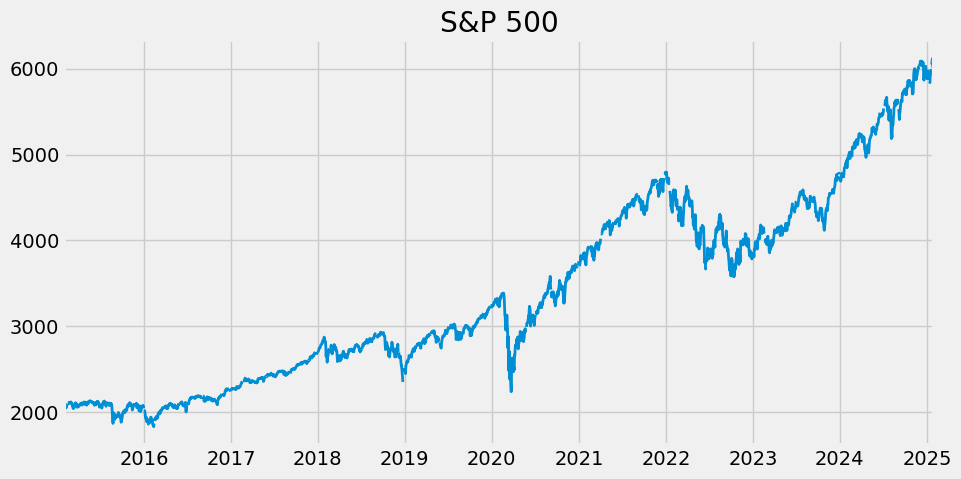

In [47]:
# 2. Pull Raw Data for S&P500 & Plot

sp500 = fred.get_series(series_id='SP500')
sp500.plot(figsize=(10, 5), title='S&P 500', lw=2)

In [109]:
# 3. Pull and Join Multiple Data Series

unemp_df = fred.search('unemployment rate state', filter=('frequency', 'Monthly'))
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate')]

all_results = []

for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)

unemp_results = pd.concat(all_results, axis = 1)

In [127]:
unemp_states = unemp_results.drop('UNRATE', axis=1)
unemp_states.dropna()

,LNS14000006,U6RATE,CAUR,TXUR,M0892AUSM156SNBR,LNS14000024,LNS14000031,M0892BUSM156SNBR,NYUR,U2RATE,FLUR,LNS14000002,LNS14000009,LNS14000003,PAUR,OHUR,U4RATE,LNS14000001,LNS14027660,MIUR,LNS14027662,ALUR,LNS14024887,MAUR,NCUR,ILUR,NJUR,GAUR,COUR,U1RATE,AZUR,WIUR,VAUR,KYUR,U5RATE,LRUN64TTUSM156S,SCUR,NMUR,MNUR,LBSSA06,TNUR,LNS14032183,LNS14000012,WAUR,LNS14027659,MDUR,ORUR,WVUR,NVUR,ARUR,OKUR,MOUR,AKUR,IAUR,UTUR,PRUR,INUR,LAUR,HIUR,LBSSA01,LASMT261982000000003,NDUR,MTUR,DCUR,LBSSA36,MSUR,LNS14000060,LNS14000028,MEUR,NEUR,LASMT391746000000003,LBSSA26,LBSSA28,LBSSA48,LBSSA12,CTUR,IDUR,NHUR,LBSSA21,LNS14000018,RIUR,KSUR,LBSSA39,LNS13025703,WYUR,LNS13023622,DEUR,LBSSA55,LBSSA42,LNS14000036,VTUR,LNS14000032,SDUR,LBSSA25,LBSSA27,LBSSA47,LBSSA24,LBSSA54,LNS13023706,LBSSA13,LBSSA23,LBSSA17,LBSSA22,LBSSA08,LBSSA37,LBSSA45,LBSSA49,LBSSA51,LBSSA18,LBSSA29,CMWRUR,LBSSA34,LNS14200000,LRUN24TTUSM156S,LBSSA19,LBSSA02,LBSSA53,LNS14027689,LBSSA04,LBSSA16,LBSSA05,LBSSA35,LNS14100000,LNS13023558,LNS13023654,LBSSA40,LBSSA31,LBSSA15,LBSSA32,LNS14000315,LNS14000029,LRHUTTTTUSM156S,LBSSA30,LBSSA41,LNS14024230,CSOUUR,LNS13026511,LNS14000025,LNS14000061,CNERUR,LRUNTTTTUSM156S,LBSSA50,LBSSA33,NEIM156SFRBRIC,CWSTUR,CNEWUR,LNS14000026,LNS14000048,LBSSA09,LBSSA38,LBSSA46,LNS14000089,M08311USM156SNBR,LNS13008397,LBSSA20,LNS14000150,NEIPTERM156SFRBRIC


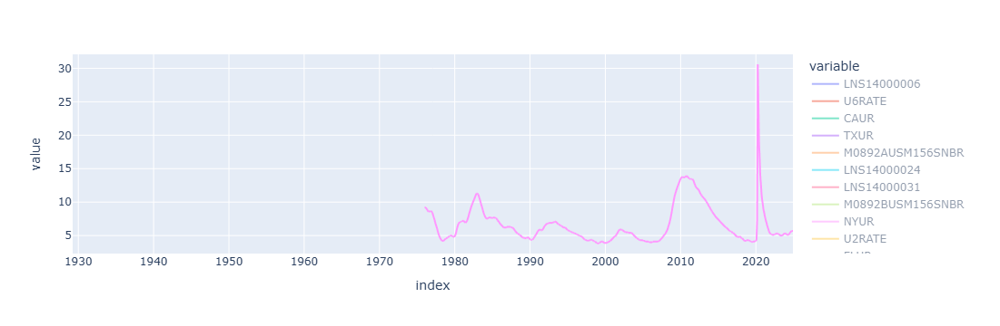

In [129]:
# Plot States Unemployment Rate
px.line(unemp_states)

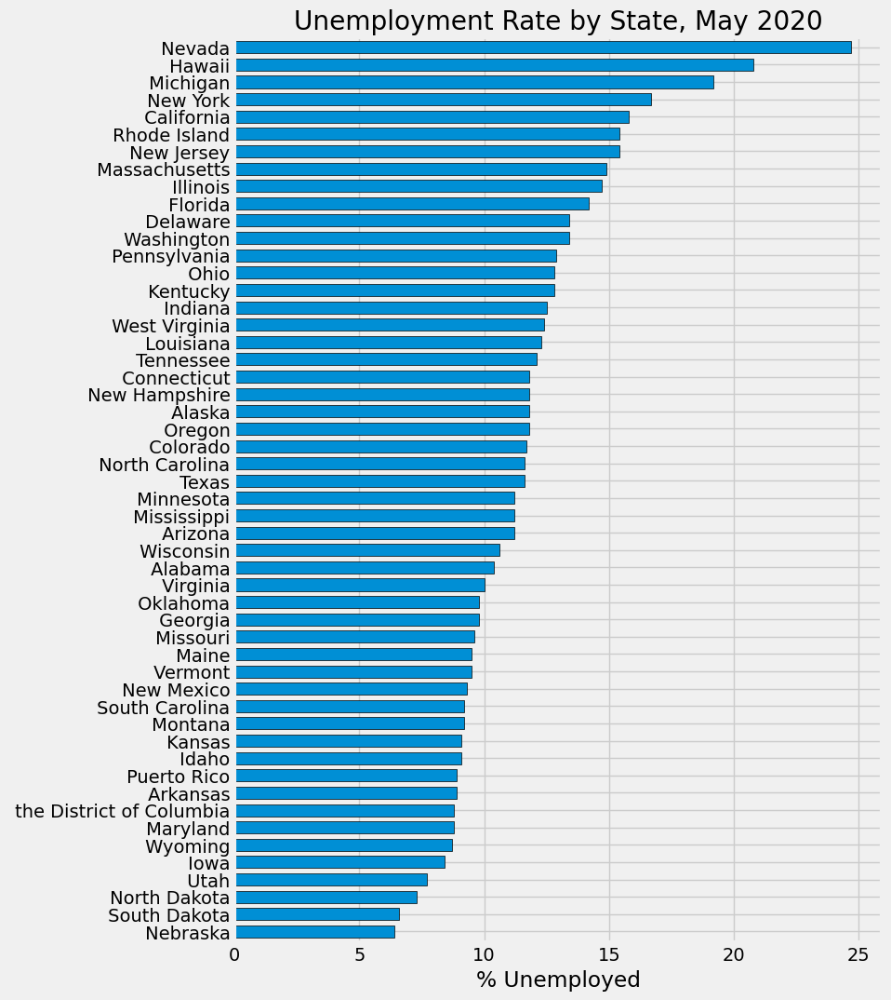

In [245]:
ax = df_filtered.loc[df_filtered.index == '2020-05-01'].T \
    .sort_values('2020-05-01') \
    .plot(kind='barh', figsize=(8, 12), width=0.7, edgecolor='black',
          title='Unemployment Rate by State, May 2020')
ax.legend().remove()
ax.set_xlabel('% Unemployed')
plt.show()

In [159]:
id_to_state = unemp_df['title'].str.replace('Unemployment Rate in', '').to_dict()

In [153]:
filtered_dict = {key: value for key, value in id_to_state.items() if len(key) == 4}

unemp_states.columns

In [216]:
df_filtered = unemp_states.loc[:, [col for col in unemp_states.columns if len(col) <= 4]]


In [225]:
df_filtered.columns = [filtered_dict[c] for c in df_filtered.columns]

In [227]:
df_filtered = df_filtered.dropna()

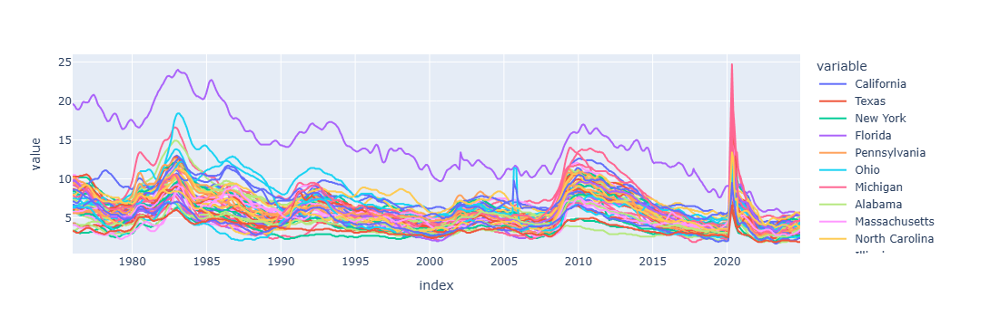

In [231]:
px.line(df_filtered)